# Experiments for determining the optimal parameters

In [1]:
# External Imports
import numpy as np

# Internal Imports
from Image import Image
from InPainter import InPainter
from Experiment import ExperimentRho, ExperimentPerc

## Comparison in terms of percentage of erased pixels
We run an experiment with a fixed relaxation parameter $\lambda=1$ and a fixed step size $\rho=1$, and vary the percentage of randonly erased pixels between $10\%$ and $100\%$. Keep in mind this will take roughly $10$ minutes to run.

Static Alpha:   0%|          | 0/30 [00:00<?, ?Value of rho/s]

Inertial Alpha:   0%|          | 0/30 [00:00<?, ?Value of rho/s]

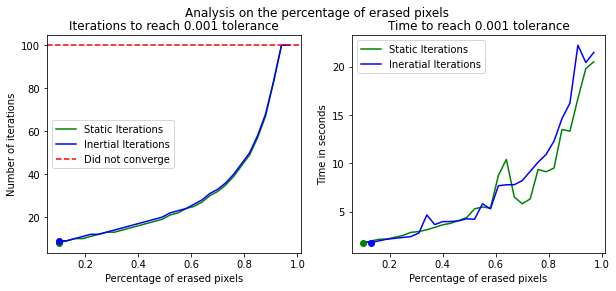

  Percentage    Its Static    Time Static    Its Inertial    Time Inertial
------------  ------------  -------------  --------------  ---------------
        0.1              8        1.75639               9          1.89828
        0.13             9        1.96264               9          1.79423
        0.16            10        2.13521              10          1.97564
        0.19            10        2.15574              11          2.14323
        0.22            11        2.34634              12          2.2366
        0.25            12        2.53192              12          2.32542
        0.28            13        2.85303              13          2.41102
        0.31            13        2.92715              14          2.78128
        0.34            14        3.12102              15          4.64925
        0.37            15        3.36465              16          3.65226
        0.4             16        3.62922              17          3.96251
        0.43            17

In [2]:
Exp_perc = ExperimentPerc(perc_list = np.arange(0.1, 0.99, 0.03), lamb = 1, rho = 1)
Exp_perc.run(max_iterations = 100, tolerance = 1e-3, title="Analysis on the percentage of erased pixels")

## Comparison in terms of the step size
We run an experiment with a fixed $\lambda=1$, whilst iterating over some representative values of the step size $\rho$, for an image with $50\%$ of its pizels randomly erased.

Static Alpha:   0%|          | 0/19 [00:00<?, ?Value of rho/s]

Inertial Alpha:   0%|          | 0/19 [00:00<?, ?Value of rho/s]

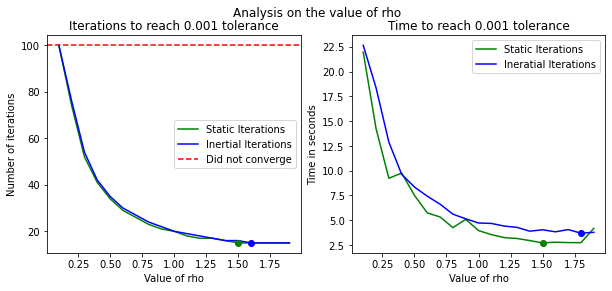

  Rho    Its Static    Time Static    Its Inertial    Time Inertial
-----  ------------  -------------  --------------  ---------------
  0.1           100       21.9693              100         22.6622
  0.2            74       14.2562               76         18.373
  0.3            52        9.23363              54         12.8924
  0.4            41        9.75762              42          9.63006
  0.5            34        7.50646              35          8.34822
  0.6            29        5.7335               30          7.42281
  0.7            26        5.32619              27          6.61533
  0.8            23        4.24618              24          5.60976
  0.9            21        5.08535              22          5.13952
  1              20        3.9518               20          4.71566
  1.1            18        3.54255              19          4.67265
  1.2            17        3.24329              18          4.40647
  1.3            17        3.15478              17  

In [3]:
Exp_rho = ExperimentRho(rho_list = np.arange(0.1, 2, 0.1), lamb = 1, ratio = 0.5)
Exp_rho.run(max_iterations = 100, tolerance = 1e-3, title="Analysis on the value of rho")

## Comparison in terms of the relaxation parameter


## Final Result
In this final section we erase $50\%$ of the pixels randomly, select a step size of $\rho=1.6$ and a relaxation parameter of $\lambda=X$ (Yet to be determined), and observe this beautiful result.

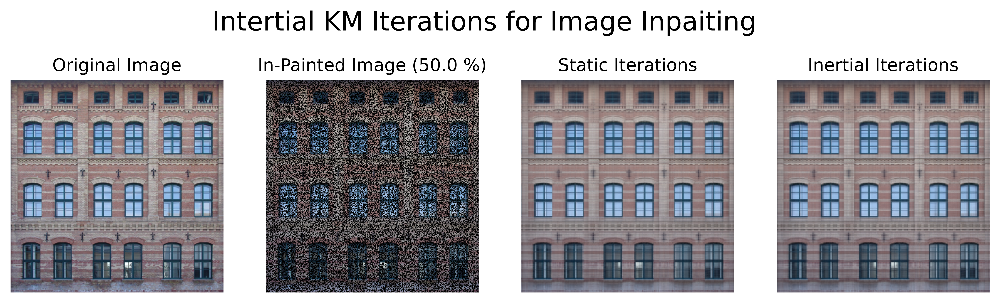

In [2]:
# Import the Image
Img = Image(image="Houses.jpeg", ratio=0.5, resize=(512, 512))

# Get Static Solution
IP_static = InPainter(Img, alpha_static = True, lamb = 1, rho = 1.6)
sol_static = IP_static.run(max_iterations = 150, tolerance = 1e-3)[0]

# Get Inertial Solution
IP_inertial = InPainter(Img, alpha_static = False, lamb = 1, rho = 1.6)
sol_inertial = IP_inertial.run(max_iterations = 150, tolerance = 1e-3)[0]

# Plot Both Solutions
Img.visualize([sol_static, "Static Iterations"], 
              [sol_inertial, "Inertial Iterations"], 
              title="Intertial KM Iterations for Image Inpaiting")